Imports

In [2]:
import numpy as np
import pandas as pd
import random

import matplotlib.pyplot as plt
import seaborn as sns


Load datasets

In [43]:
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')

In [4]:
train.head()

,id,date,country,store,product,num_sold
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230130 entries, 0 to 230129
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   id        230130 non-null  int64  
 1   date      230130 non-null  object 
 2   country   230130 non-null  object 
 3   store     230130 non-null  object 
 4   product   230130 non-null  object 
 5   num_sold  221259 non-null  float64
dtypes: float64(1), int64(1), object(4)
memory usage: 10.5+ MB


In [6]:
train['country'].unique()

array(['Canada', 'Finland', 'Italy', 'Kenya', 'Norway', 'Singapore'],
      dtype=object)

In [7]:
train['store'].unique()

array(['Discount Stickers', 'Stickers for Less', 'Premium Sticker Mart'],
      dtype=object)

In [8]:
train['product'].unique()

array(['Holographic Goose', 'Kaggle', 'Kaggle Tiers', 'Kerneler',
       'Kerneler Dark Mode'], dtype=object)

graphic analysis

In [9]:
def plot_individual_ts(df):
    colour_map = {"Canada": "blue", "Finland": "orange", "Italy": "green", "Kenya":"red", "Norway": "purple", "Singapore": "brown"}
    for country in df["country"].unique():
        f,axes = plt.subplots(df["store"].nunique()*df["product"].nunique(),figsize=(20,75))
        count = 0
        for store in df["store"].unique():
            for product in df["product"].unique():
                plot_df = df.loc[(df["product"] == product) & (df["country"] == country) & (df["store"] == store)]
                sns.lineplot(data = plot_df, x= "date", y="num_sold", linewidth=0.5, ax=axes[count], color=colour_map[country])
                axes[count].set_title(f"{country} - {store} - {product}")
                axes[count].axvline(pd.to_datetime("2017-01-01"), color='black', linestyle='--');
                count+=1

ConversionError: Failed to convert value(s) to axis units: Timestamp('2017-01-01 00:00:00')

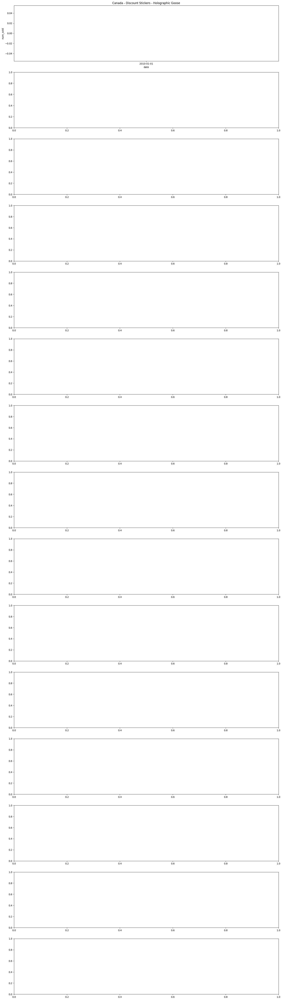

In [10]:
plot_individual_ts(train)

data preparation

set time index

In [11]:
train['date'] = pd.to_datetime(train['date'], format='%Y-%m-%d')
test['date'] = pd.to_datetime(test['date'], format='%Y-%m-%d')

the date is made the index as is a prerrequisite of sklearn

In [12]:
train =train.set_index('date')
test = test.set_index('date')

grouped by country, store and product and generate a dictionary containing individual dataframes, this dataframes will be grouped together to generate multiseries datasets for each product while being used individually to do the predictions. Train and test dataframes corresponding to the same set of conditions will be stored under the same key.

In [13]:
#Grouping
grouped_train = train.groupby(['country', 'store', 'product'])
grouped_test = test.groupby(['country', 'store', 'product'])

In [14]:
#Combine in a dict
combine_dict = {
        key: [group1, grouped_test.get_group(key)]
        for key, group1 in grouped_train
        if key in grouped_test.groups 
    }

Now that the index is a single continuous series of dates, we can check the integrity

In [15]:
for key in combine_dict.keys():
    combine_dict[key][0] = combine_dict[key][0].asfreq('D')
    combine_dict[key][0] = combine_dict[key][0].sort_index()
    combine_dict[key][1] = combine_dict[key][1].asfreq('D')
    combine_dict[key][1] = combine_dict[key][1].sort_index()

There are N/A for the number of stickers sold in some of the datasets, as sklearn doesn't accept N/A, they will be filled with the average of the previous and following values

In [16]:
#create a function that fills the NA
def fill_with_mean_neighbor(series):
    for i in range(len(series)):
        if pd.isna(series.iloc[i]):  # Verify whether it is NaN
            # Get previous and following value
            prev_val = series.iloc[i - 1] if i > 0 else np.nan
            next_val = series.iloc[i + 1] if i < len(series) - 1 else np.nan
            # Calculate average
            neighbors = [val for val in [prev_val, next_val] if not pd.isna(val)]
            series.iloc[i] = np.mean(neighbors) if neighbors else np.nan
    return series

In [17]:
#loop through the dictionary to isolate the series with N/A
for lst in combine_dict.values():
        for group in lst:
            if group.isnull().any(axis=1).sum() == len(group):
                group.fillna(0, inplace=True)
            elif group.isnull().any(axis=1).sum() > 0:
                group.apply(fill_with_mean_neighbor)

Now that the dataframe is clean, it will be organized by products in a dictionary, such that each key (product) will contain a dataframe arranged in a way that sklearn ForecasterRecursiveMultiSeries can be used. In this manner, we create a predictive model for each product using the combination of several time series corresponding to different shops and countries where the product is sold.

First, a lis of the different products is built

In [18]:
products_list = list(train['product'].unique())
products_list

['Holographic Goose',
 'Kaggle',
 'Kaggle Tiers',
 'Kerneler',
 'Kerneler Dark Mode']

Then, the train dataframes are isolated from the test in the combined dictionary

In [19]:
train_df_dic = {key:value[0] for key,value in combine_dict.items()}

There are several columns that are not usable because they contain only zero values in the 'num_sold' column, which need to be removed.

In [20]:
y_column = 'num_sold'

In [21]:
clean_df_dic = dict()
for key, dataset in train_df_dic.items():
    if dataset[y_column].sum() != 0:
        clean_df_dic[key] = dataset

Now, the dataframes need to reconstructed so every different condition (that is, combination of country, shop and product) is set as a column of the dataframe. This is the format needed to use ForecasterRecursiveMultiSeries. With this purpose, the following function is defined:

In [22]:
def group_df(grouped_dic):
    reorg_df = pd.DataFrame({'_'.join(key):df[y_column] for key, df in grouped_dic.items()}) 
    return reorg_df

In [23]:
clean_arranged_df = group_df(clean_df_dic)

In [24]:
clean_arranged_df.head()

,Canada_Discount Stickers_Kaggle,Canada_Discount Stickers_Kaggle Tiers,Canada_Discount Stickers_Kerneler,Canada_Discount Stickers_Kerneler Dark Mode,Canada_Premium Sticker Mart_Holographic Goose,Canada_Premium Sticker Mart_Kaggle,Canada_Premium Sticker Mart_Kaggle Tiers,Canada_Premium Sticker Mart_Kerneler,Canada_Premium Sticker Mart_Kerneler Dark Mode,Canada_Stickers for Less_Holographic Goose,...,Singapore_Premium Sticker Mart_Holographic Goose,Singapore_Premium Sticker Mart_Kaggle,Singapore_Premium Sticker Mart_Kaggle Tiers,Singapore_Premium Sticker Mart_Kerneler,Singapore_Premium Sticker Mart_Kerneler Dark Mode,Singapore_Stickers for Less_Holographic Goose,Singapore_Stickers for Less_Kaggle,Singapore_Stickers for Less_Kaggle Tiers,Singapore_Stickers for Less_Kerneler,Singapore_Stickers for Less_Kerneler Dark Mode
date,,,,,,,,,,,,,,,,,,,,,
2010-01-01,973.0,906.0,423.0,491.0,375.0,2212.0,2013.0,950.0,1213.0,300.0,...,317.0,2112.0,1992.0,1045.0,1255.0,301.0,1981.0,1565.0,841.0,1080.0
2010-01-02,881.0,854.0,440.0,437.0,336.0,2183.0,1953.0,895.0,1217.0,281.0,...,364.0,2322.0,1938.0,1010.0,1224.0,268.0,1763.0,1689.0,781.0,971.0
2010-01-03,1003.0,839.0,417.0,495.0,338.0,2459.0,1938.0,1015.0,1188.0,297.0,...,388.0,2253.0,2315.0,1040.0,1314.0,289.0,1801.0,1690.0,813.0,987.0
2010-01-04,744.0,609.0,339.0,441.0,277.0,1714.0,1567.0,802.0,1046.0,235.0,...,269.0,1760.0,1656.0,846.0,927.0,256.0,1543.0,1205.0,602.0,839.0
2010-01-05,707.0,640.0,290.0,372.0,287.0,1593.0,1590.0,773.0,894.0,240.0,...,264.0,1536.0,1410.0,770.0,962.0,226.0,1364.0,1352.0,629.0,795.0


Next, the columns for each product are isolated and a specific dataframe for each product is constructed and stored again in a dictionary

In [25]:
prod_clean_df_dic = dict()
for prod in products_list:
    prod_df = pd.DataFrame()
    for col in clean_arranged_df.columns:
        if prod in col:
            prod_df = pd.concat([prod_df, clean_arranged_df[col]], axis=1)
            prod_clean_df_dic[prod] = prod_df

In [26]:
display(prod_clean_df_dic['Holographic Goose'].info())

<class 'pandas.core.frame.DataFrame'>
Index: 2557 entries, 2010-01-01 00:00:00 to 2016-12-31 00:00:00
Data columns (total 16 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Canada_Premium Sticker Mart_Holographic Goose     2557 non-null   float64
 1   Canada_Stickers for Less_Holographic Goose        2557 non-null   float64
 2   Finland_Discount Stickers_Holographic Goose       2557 non-null   float64
 3   Finland_Premium Sticker Mart_Holographic Goose    2557 non-null   float64
 4   Finland_Stickers for Less_Holographic Goose       2557 non-null   float64
 5   Italy_Discount Stickers_Holographic Goose         2557 non-null   float64
 6   Italy_Premium Sticker Mart_Holographic Goose      2557 non-null   float64
 7   Italy_Stickers for Less_Holographic Goose         2557 non-null   float64
 8   Kenya_Premium Sticker Mart_Holographic Goose      2557 non-null   floa

None

In [27]:
""" from skforecast.recursive import ForecasterRecursive
from skforecast.recursive import ForecasterSarimax
from sklearn.ensemble import RandomForestRegressor
from skforecast.model_selection import TimeSeriesFold
from skforecast.model_selection import grid_search_forecaster, grid_search_sarimax
from skforecast.sarimax import Sarimax
from skforecast.exceptions import LongTrainingWarning
from skforecast.direct import ForecasterDirect
from skforecast.recursive._forecaster_recursive_multiseries import ForecasterRecursiveMultiSeries

from sklearn.preprocessing import StandardScaler """

' from skforecast.recursive import ForecasterRecursive\nfrom skforecast.recursive import ForecasterSarimax\nfrom sklearn.ensemble import RandomForestRegressor\nfrom skforecast.model_selection import TimeSeriesFold\nfrom skforecast.model_selection import grid_search_forecaster, grid_search_sarimax\nfrom skforecast.sarimax import Sarimax\nfrom skforecast.exceptions import LongTrainingWarning\nfrom skforecast.direct import ForecasterDirect\nfrom skforecast.recursive._forecaster_recursive_multiseries import ForecasterRecursiveMultiSeries\n\nfrom sklearn.preprocessing import StandardScaler '

In [28]:
from sklearn.ensemble import RandomForestRegressor
from skforecast.recursive._forecaster_recursive_multiseries import ForecasterRecursiveMultiSeries
from sklearn.preprocessing import StandardScaler

The dataframes are ready for analysis. Two functions are constructed to create the model and the predictions using ForecasterRecursiveMultiSeries

In [29]:
def create_fit_multi_forecaster(steps, df):
    forecaster = ForecasterRecursiveMultiSeries(
                regressor          = RandomForestRegressor(random_state=123),
                lags               = steps,
                transformer_series = StandardScaler(),
                transformer_exog   = None,
                weight_func        = None,
                series_weights     = None
            )
    
    forecaster.fit(series=df)
    return forecaster

def predict_multi(steps, forecaster, level):
    prediction_level = forecaster.predict(steps=steps, levels=level)
    return prediction_level     

Finally, each product is analysed sequentially

The steps are the lenght of the test dataframe for each product

In [30]:
dic_sample = random.choice(list(combine_dict.values()))
train_sample, test_sample = dic_sample[0], dic_sample[1]
steps = len(test_sample)
steps

1095

In [31]:
def añlskdjf


SyntaxError: expected '(' (2069741478.py, line 1)

In [32]:
def
#The results are stored in a dataframe
submission = pd.DataFrame()
counter = 0
for prod in products_list:
    print(prod)
    #The dataframe with information for each product is isolated
    prod_dataset = prod_clean_df_dic[prod]
    forecaster = create_fit_multi_forecaster(steps, prod_dataset)

    #A loop is set through all the different individualized products
    for key, value in combine_dict.items():
        level_str = '_'.join(key)
        print(level_str)

        #If the product for wich we are looping is detected, predictions are made
        if prod in level_str.split('_'):
            counter += 1
            print(counter)
            print(key)
            if level_str in prod_dataset.columns:
                predictions = predict_multi(steps, forecaster, level_str)
                predictions.index = value[1].index
                #Predictions are added as a column to the test set for each product
                test_w_preds = pd.concat([value[1], predictions], axis=1).rename(columns={f'{level_str}':'num_sold'})
            #If the individualized product is not in the dataset, that means it was removed for being all zeroes, hence the predictions are set to zeroes as well
            else:
                value[1]['num_sold'] = 0
                test_w_preds = value[1]
            #All the predictions are concatenated and distinguished by its unique id
            submission = pd.concat([submission, test_w_preds])
            display(submission)
            submission = submission.reset_index()[['id', 'num_sold']].sort_values('id')
            print(f'submission_updated for {key}')
submission.to_csv('sklearn_example.csv', index=False)
print('submission_saved')

SyntaxError: invalid syntax (971185376.py, line 1)

In [67]:
example_sub = pd.read_csv('sklearn_example.csv')

In [68]:
example_sub.head()

,id,num_sold
0,230131,849.546055
1,230136,1605.034948
2,230141,1995.529808
3,230146,877.806602
4,230151,1841.689152


In [73]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98550 entries, 0 to 98549
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       98550 non-null  int64 
 1   date     98550 non-null  object
 2   country  98550 non-null  object
 3   store    98550 non-null  object
 4   product  98550 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [74]:
98550/5

19710.0

In [70]:
test_ri = test.reset_index()
test_ri.head()

,index,id,date,country,store,product
0,0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode


In [72]:
merged_test = pd.merge(test_ri, example_sub, how='inner')
merged_test.head()

,index,id,date,country,store,product,num_sold
0,1,230131,2017-01-01,Canada,Discount Stickers,Kaggle,849.546055
1,6,230136,2017-01-01,Canada,Stickers for Less,Kaggle,1605.034948
2,11,230141,2017-01-01,Canada,Premium Sticker Mart,Kaggle,1995.529808
3,16,230146,2017-01-01,Finland,Discount Stickers,Kaggle,877.806602
4,21,230151,2017-01-01,Finland,Stickers for Less,Kaggle,1841.689152


In [60]:
merged_test[merged_test['product']=='Kaggle'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19710 entries, 0 to 19709
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   index     19710 non-null  int64  
 1   id        19710 non-null  int64  
 2   date      19710 non-null  object 
 3   country   19710 non-null  object 
 4   store     19710 non-null  object 
 5   product   19710 non-null  object 
 6   num_sold  19710 non-null  float64
dtypes: float64(1), int64(2), object(4)
memory usage: 1.1+ MB


In [51]:
complete_df = pd.concat([train, merged_test])
complete_df

,id,date,country,store,product,num_sold,index
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.000000,NaN
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.000000,NaN
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.000000,NaN
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.000000,NaN
...,...,...,...,...,...,...,...
19705,328656,2019-12-31,Norway,Stickers for Less,Kaggle,2651.328238,98526.0
19706,328661,2019-12-31,Norway,Premium Sticker Mart,Kaggle,3145.550895,98531.0
19707,328666,2019-12-31,Singapore,Discount Stickers,Kaggle,974.473716,98536.0
19708,328671,2019-12-31,Singapore,Stickers for Less,Kaggle,2022.724923,98541.0


In [52]:
complete_df['date'] = pd.to_datetime(complete_df['date'], format='%Y-%m-%d')

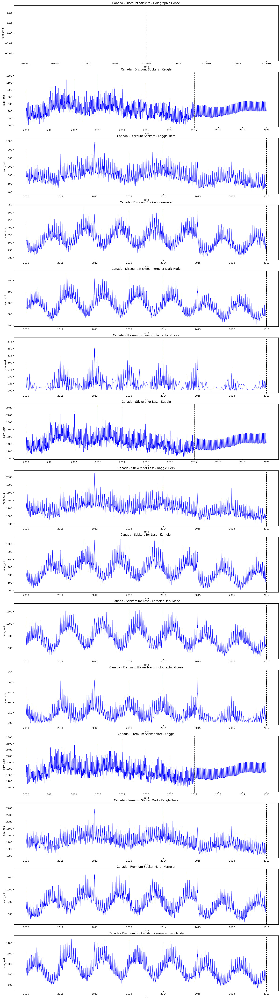

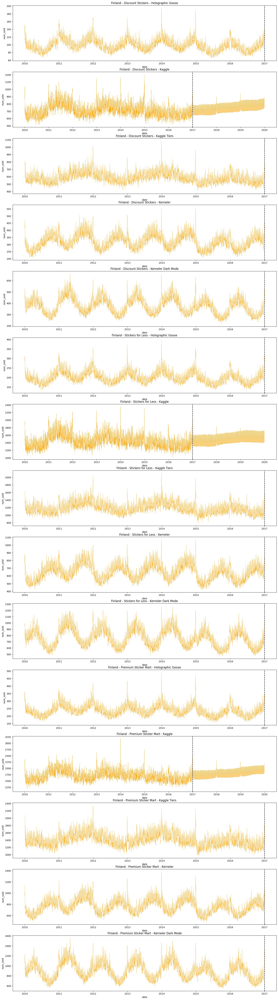

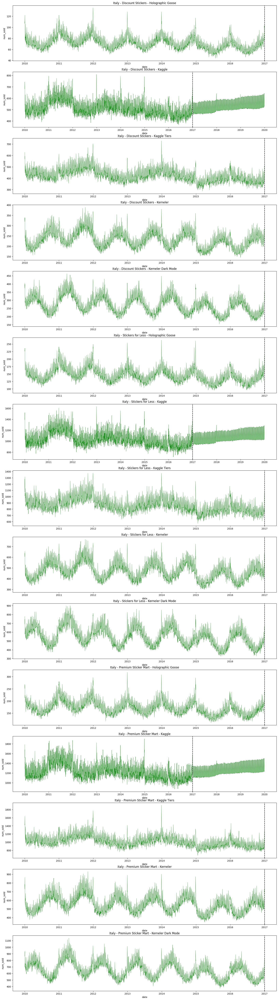

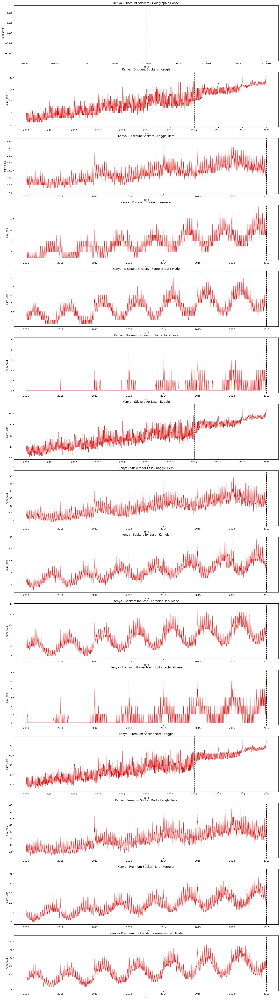

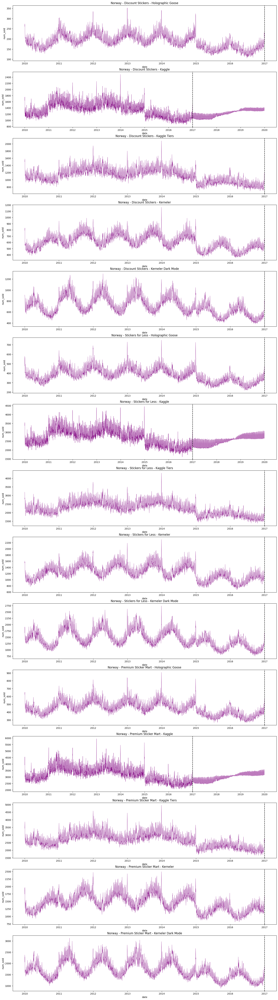

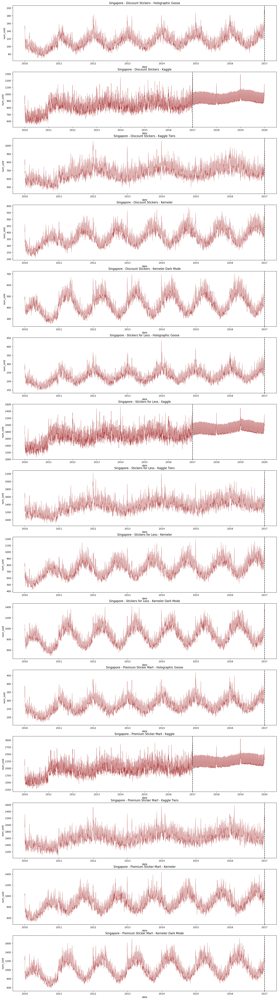

In [53]:
plot_individual_ts(complete_df)